In [12]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from os import listdir
from os.path import isfile, join
import os
import time

from sklearn.cluster import MiniBatchKMeans
import matplotlib.pyplot as plt

In [13]:
#ONLY PHOTOS FOR TRAINING
path_serg = 'F://pictures_cv_serg/'
path_nick = 'F://pictures_cv_nick/'
path_roma = 'F://pictures_cv_roma/'
path_noobject = 'F://pictures_cv_noobject/'


In [14]:
### LOADING IMAGES
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename), cv2.IMREAD_GRAYSCALE)
        if img is not None:
            images.append(img)
    return images

In [15]:
serg_images = load_images_from_folder(path_serg)
nick_images = load_images_from_folder(path_nick)
roma_images = load_images_from_folder(path_roma)
noobject_images = load_images_from_folder(path_noobject)

In [16]:
### CREATING SIFT OBJECT
sift = cv2.SIFT_create()
orb = cv2.ORB_create()
star = cv2.xfeatures2d.StarDetector_create()
brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()

In [17]:
#GETTING DESCRIPTORS
def des_with_sift(images):
    dico = []
    for image in images:
        #### FOR BETTER ACCURACY CHANGE RESIZE SHAPE 4 ->(2, 3) (CAN PROCEED MUCH LONGER, BE CAREFUL)
        image = cv2.resize(image, (image.shape[0]//4, image.shape[1]//4), interpolation = cv2.INTER_AREA)
        kp, des = sift.detectAndCompute(image, None)
        if des is not None:
            for d in des:
                dico.append(d)
    return dico

In [18]:
#GETTING DESCRIPTORS
def des_with_orb(images):
    dico = []
    for image in images:
        #### FOR BETTER ACCURACY CHANGE RESIZE SHAPE 4 ->(2, 3) (CAN PROCEED MUCH LONGER, BE CAREFUL)
        image = cv2.resize(image, (image.shape[0]//4, image.shape[1]//4), interpolation = cv2.INTER_AREA)
        kp, des = orb.detectAndCompute(image, None)
        if des is not None:
            for d in des:
                dico.append(d)
    return dico

In [19]:
#GETTING DESCRIPTORS
def des_with_brief(images):
    dico = []
    for image in images:
        #### FOR BETTER ACCURACY CHANGE RESIZE SHAPE 4 ->(2, 3) (CAN PROCEED MUCH LONGER, BE CAREFUL)
        image = cv2.resize(image, (image.shape[0]//4, image.shape[1]//4), interpolation = cv2.INTER_AREA)
        kp_star = star.detect(image,None)
        kp, des = brief.compute(image, kp_star)
        if des is not None:
            for d in des:
                dico.append(d)
    return dico

In [20]:
des_roma = des_with_orb(roma_images)

In [21]:
des_serg = des_with_orb(serg_images)

In [22]:
des_nick = des_with_orb(nick_images)

In [23]:
des_noobject = des_with_orb(noobject_images)

In [24]:
print(len(des_roma), len(des_serg), len(des_nick), len(des_noobject))

26814 32365 35000 33366


In [25]:
#### CLUSTERING WITH K-MEANS (MINIK-MEANS TO AVOID OUT_OF_MEMORY_ERROR)
def clustering(descriptors):
    k = 40 #### HYPERPARAM, CHANGE TO SEE IF BETTER/WORSE ACCURACY
    kmeans = MiniBatchKMeans(n_clusters=k, verbose=1).fit(descriptors)
    return kmeans

In [26]:
descriptors = des_serg + des_nick+des_roma +des_noobject

In [27]:
kmeans = clustering(descriptors)

Init 1/3 with method: k-means++
Inertia for init 1/3: 32528724.839096
Init 2/3 with method: k-means++
Inertia for init 2/3: 31744862.213639
Init 3/3 with method: k-means++
Inertia for init 3/3: 31908564.798628
Minibatch iteration 1/127600: mean batch inertia: 134691.971773, ewa inertia: 134691.971773 
Minibatch iteration 2/127600: mean batch inertia: 131337.843152, ewa inertia: 134686.712292 
Minibatch iteration 3/127600: mean batch inertia: 125662.448166, ewa inertia: 134672.561689 
Minibatch iteration 4/127600: mean batch inertia: 122929.883582, ewa inertia: 134654.148445 
Minibatch iteration 5/127600: mean batch inertia: 123308.663993, ewa inertia: 134636.358025 
Minibatch iteration 6/127600: mean batch inertia: 121001.378314, ewa inertia: 134614.977536 
Minibatch iteration 7/127600: mean batch inertia: 120330.327957, ewa inertia: 134592.578323 
Minibatch iteration 8/127600: mean batch inertia: 120060.309840, ewa inertia: 134569.790829 
Minibatch iteration 9/127600: mean batch inert

Minibatch iteration 124/127600: mean batch inertia: 117151.698970, ewa inertia: 131837.395320 
Minibatch iteration 125/127600: mean batch inertia: 119372.198487, ewa inertia: 131817.849122 
Minibatch iteration 126/127600: mean batch inertia: 119311.522094, ewa inertia: 131798.238429 
Minibatch iteration 127/127600: mean batch inertia: 117191.513970, ewa inertia: 131775.334184 
Minibatch iteration 128/127600: mean batch inertia: 117773.365299, ewa inertia: 131753.378232 
Minibatch iteration 129/127600: mean batch inertia: 119924.736110, ewa inertia: 131734.830191 
Minibatch iteration 130/127600: mean batch inertia: 118940.309830, ewa inertia: 131714.767594 
Minibatch iteration 131/127600: mean batch inertia: 118362.959747, ewa inertia: 131693.831135 
Minibatch iteration 132/127600: mean batch inertia: 114504.078260, ewa inertia: 131666.876542 
Minibatch iteration 133/127600: mean batch inertia: 118473.285187, ewa inertia: 131646.188176 
Minibatch iteration 134/127600: mean batch inertia

Minibatch iteration 215/127600: mean batch inertia: 110636.049091, ewa inertia: 129787.318151 
Minibatch iteration 216/127600: mean batch inertia: 116150.895034, ewa inertia: 129765.935398 
Minibatch iteration 217/127600: mean batch inertia: 113758.499924, ewa inertia: 129740.834751 
Minibatch iteration 218/127600: mean batch inertia: 117592.696081, ewa inertia: 129721.785720 
Minibatch iteration 219/127600: mean batch inertia: 121107.747966, ewa inertia: 129708.278377 
Minibatch iteration 220/127600: mean batch inertia: 116987.533605, ewa inertia: 129688.331464 
Minibatch iteration 221/127600: mean batch inertia: 118152.492761, ewa inertia: 129670.242557 
Minibatch iteration 222/127600: mean batch inertia: 116379.546146, ewa inertia: 129649.401925 
Minibatch iteration 223/127600: mean batch inertia: 115243.158394, ewa inertia: 129626.812046 
Minibatch iteration 224/127600: mean batch inertia: 115810.172320, ewa inertia: 129605.146702 
Minibatch iteration 225/127600: mean batch inertia

Minibatch iteration 311/127600: mean batch inertia: 113463.274832, ewa inertia: 127917.970116 
Minibatch iteration 312/127600: mean batch inertia: 115304.052243, ewa inertia: 127898.190714 
Minibatch iteration 313/127600: mean batch inertia: 118127.236238, ewa inertia: 127882.869255 
Minibatch iteration 314/127600: mean batch inertia: 111507.464647, ewa inertia: 127857.191609 
Minibatch iteration 315/127600: mean batch inertia: 118573.188087, ewa inertia: 127842.633719 
Minibatch iteration 316/127600: mean batch inertia: 115784.250042, ewa inertia: 127823.725429 
Minibatch iteration 317/127600: mean batch inertia: 115230.277628, ewa inertia: 127803.978126 
Minibatch iteration 318/127600: mean batch inertia: 113042.272192, ewa inertia: 127780.830860 
Minibatch iteration 319/127600: mean batch inertia: 111515.135548, ewa inertia: 127755.325246 
Minibatch iteration 320/127600: mean batch inertia: 115701.226145, ewa inertia: 127736.423674 
Minibatch iteration 321/127600: mean batch inertia

Minibatch iteration 407/127600: mean batch inertia: 115533.626993, ewa inertia: 126229.297214 
Minibatch iteration 408/127600: mean batch inertia: 115222.729150, ewa inertia: 126212.038236 
Minibatch iteration 409/127600: mean batch inertia: 114386.952023, ewa inertia: 126193.495771 
Minibatch iteration 410/127600: mean batch inertia: 111181.064883, ewa inertia: 126169.955353 
Minibatch iteration 411/127600: mean batch inertia: 116894.767907, ewa inertia: 126155.411287 
Minibatch iteration 412/127600: mean batch inertia: 116758.216607, ewa inertia: 126140.675905 
Minibatch iteration 413/127600: mean batch inertia: 114163.745721, ewa inertia: 126121.895340 
Minibatch iteration 414/127600: mean batch inertia: 117020.054781, ewa inertia: 126107.623092 
Minibatch iteration 415/127600: mean batch inertia: 117484.859427, ewa inertia: 126094.102066 
Minibatch iteration 416/127600: mean batch inertia: 110726.421919, ewa inertia: 126070.004595 
Minibatch iteration 417/127600: mean batch inertia

Minibatch iteration 502/127600: mean batch inertia: 115838.054569, ewa inertia: 124673.797397 
Minibatch iteration 503/127600: mean batch inertia: 113111.711993, ewa inertia: 124655.667333 
Minibatch iteration 504/127600: mean batch inertia: 113101.945563, ewa inertia: 124637.550384 
Minibatch iteration 505/127600: mean batch inertia: 109232.464385, ewa inertia: 124613.394259 
Minibatch iteration 506/127600: mean batch inertia: 113522.559240, ewa inertia: 124596.003145 
Minibatch iteration 507/127600: mean batch inertia: 116626.655072, ewa inertia: 124583.506715 
Minibatch iteration 508/127600: mean batch inertia: 118087.865886, ewa inertia: 124573.321150 
Minibatch iteration 509/127600: mean batch inertia: 113056.139200, ewa inertia: 124555.261498 
Minibatch iteration 510/127600: mean batch inertia: 118650.494928, ewa inertia: 124546.002459 
Minibatch iteration 511/127600: mean batch inertia: 112001.925017, ewa inertia: 124526.332571 
Minibatch iteration 512/127600: mean batch inertia

Minibatch iteration 595/127600: mean batch inertia: 114381.291893, ewa inertia: 123373.018908 
Minibatch iteration 596/127600: mean batch inertia: 114217.578556, ewa inertia: 123358.662612 
Minibatch iteration 597/127600: mean batch inertia: 114024.020342, ewa inertia: 123344.025317 
Minibatch iteration 598/127600: mean batch inertia: 112958.451639, ewa inertia: 123327.740096 
Minibatch iteration 599/127600: mean batch inertia: 112431.210953, ewa inertia: 123310.653666 
Minibatch iteration 600/127600: mean batch inertia: 118189.585862, ewa inertia: 123302.623516 
Minibatch iteration 601/127600: mean batch inertia: 115553.251058, ewa inertia: 123290.472021 
Minibatch iteration 602/127600: mean batch inertia: 111855.716029, ewa inertia: 123272.541618 
Minibatch iteration 603/127600: mean batch inertia: 116294.278554, ewa inertia: 123261.599271 
Minibatch iteration 604/127600: mean batch inertia: 116962.143535, ewa inertia: 123251.721336 
Minibatch iteration 605/127600: mean batch inertia

Minibatch iteration 742/127600: mean batch inertia: 116865.519192, ewa inertia: 121684.155989 
Minibatch iteration 743/127600: mean batch inertia: 117060.833745, ewa inertia: 121676.906335 
Minibatch iteration 744/127600: mean batch inertia: 118151.590820, ewa inertia: 121671.378422 
Minibatch iteration 745/127600: mean batch inertia: 112146.510332, ewa inertia: 121656.442841 
Minibatch iteration 746/127600: mean batch inertia: 112273.294145, ewa inertia: 121641.729485 
Minibatch iteration 747/127600: mean batch inertia: 114907.368551, ewa inertia: 121631.169591 
Minibatch iteration 748/127600: mean batch inertia: 115665.435910, ewa inertia: 121621.814953 
Minibatch iteration 749/127600: mean batch inertia: 118553.775693, ewa inertia: 121617.004078 
Minibatch iteration 750/127600: mean batch inertia: 112707.340073, ewa inertia: 121603.033175 
Minibatch iteration 751/127600: mean batch inertia: 114690.709465, ewa inertia: 121592.194225 
Minibatch iteration 752/127600: mean batch inertia

Minibatch iteration 890/127600: mean batch inertia: 111252.055830, ewa inertia: 120244.966610 
Minibatch iteration 891/127600: mean batch inertia: 112098.180160, ewa inertia: 120232.191946 
Minibatch iteration 892/127600: mean batch inertia: 114405.616842, ewa inertia: 120223.055516 
Minibatch iteration 893/127600: mean batch inertia: 120377.916500, ewa inertia: 120223.298348 
Minibatch iteration 894/127600: mean batch inertia: 115646.824001, ewa inertia: 120216.122154 
Minibatch iteration 895/127600: mean batch inertia: 114227.428279, ewa inertia: 120206.731512 
Minibatch iteration 896/127600: mean batch inertia: 113933.336870, ewa inertia: 120196.894442 
Minibatch iteration 897/127600: mean batch inertia: 115383.242541, ewa inertia: 120189.346339 
Minibatch iteration 898/127600: mean batch inertia: 113396.462270, ewa inertia: 120178.694677 
Minibatch iteration 899/127600: mean batch inertia: 116276.767251, ewa inertia: 120172.576214 
Minibatch iteration 900/127600: mean batch inertia

Minibatch iteration 1057/127600: mean batch inertia: 111750.391232, ewa inertia: 119068.654474 
Minibatch iteration 1058/127600: mean batch inertia: 117397.936175, ewa inertia: 119066.034684 
Minibatch iteration 1059/127600: mean batch inertia: 113554.021365, ewa inertia: 119057.391507 
Minibatch iteration 1060/127600: mean batch inertia: 116967.775304, ewa inertia: 119054.114860 
Minibatch iteration 1061/127600: mean batch inertia: 116202.038757, ewa inertia: 119049.642629 
Minibatch iteration 1062/127600: mean batch inertia: 114232.922808, ewa inertia: 119042.089715 
Minibatch iteration 1063/127600: mean batch inertia: 114235.649862, ewa inertia: 119034.552920 
Minibatch iteration 1064/127600: mean batch inertia: 113409.797356, ewa inertia: 119025.732957 
Minibatch iteration 1065/127600: mean batch inertia: 116478.545694, ewa inertia: 119021.738810 
Minibatch iteration 1066/127600: mean batch inertia: 117856.278147, ewa inertia: 119019.911295 
Minibatch iteration 1067/127600: mean ba

Minibatch iteration 1149/127600: mean batch inertia: 112106.058891, ewa inertia: 118497.364573 
Minibatch iteration 1150/127600: mean batch inertia: 118023.577696, ewa inertia: 118496.621646 
Minibatch iteration 1151/127600: mean batch inertia: 117575.774028, ewa inertia: 118495.177700 
Minibatch iteration 1152/127600: mean batch inertia: 120675.160020, ewa inertia: 118498.596046 
Minibatch iteration 1153/127600: mean batch inertia: 110734.424698, ewa inertia: 118486.421347 
Minibatch iteration 1154/127600: mean batch inertia: 112182.074560, ewa inertia: 118476.535742 
Minibatch iteration 1155/127600: mean batch inertia: 119258.306852, ewa inertia: 118477.761607 
Minibatch iteration 1156/127600: mean batch inertia: 118053.095762, ewa inertia: 118477.095705 
Minibatch iteration 1157/127600: mean batch inertia: 114518.329208, ewa inertia: 118470.888115 
Minibatch iteration 1158/127600: mean batch inertia: 113335.722392, ewa inertia: 118462.835858 
Minibatch iteration 1159/127600: mean ba

Minibatch iteration 1293/127600: mean batch inertia: 111200.684794, ewa inertia: 117829.600926 
Minibatch iteration 1294/127600: mean batch inertia: 121449.338732, ewa inertia: 117835.276898 
Minibatch iteration 1295/127600: mean batch inertia: 118535.270851, ewa inertia: 117836.374532 
Minibatch iteration 1296/127600: mean batch inertia: 119837.460925, ewa inertia: 117839.512359 
Minibatch iteration 1297/127600: mean batch inertia: 112059.116888, ewa inertia: 117830.448342 
Minibatch iteration 1298/127600: mean batch inertia: 112280.174918, ewa inertia: 117821.745171 
Minibatch iteration 1299/127600: mean batch inertia: 111868.325203, ewa inertia: 117812.409841 
Minibatch iteration 1300/127600: mean batch inertia: 116797.655620, ewa inertia: 117810.818644 
Minibatch iteration 1301/127600: mean batch inertia: 115575.741339, ewa inertia: 117807.313904 
Minibatch iteration 1302/127600: mean batch inertia: 114998.404538, ewa inertia: 117802.909361 
Minibatch iteration 1303/127600: mean ba

Minibatch iteration 1445/127600: mean batch inertia: 116200.063052, ewa inertia: 117193.316882 
Minibatch iteration 1446/127600: mean batch inertia: 114139.230771, ewa inertia: 117188.527887 
Minibatch iteration 1447/127600: mean batch inertia: 115381.576242, ewa inertia: 117185.694475 
Minibatch iteration 1448/127600: mean batch inertia: 117359.579420, ewa inertia: 117185.967137 
Minibatch iteration 1449/127600: mean batch inertia: 115448.910596, ewa inertia: 117183.243325 
Minibatch iteration 1450/127600: mean batch inertia: 114936.672821, ewa inertia: 117179.720564 
Minibatch iteration 1451/127600: mean batch inertia: 115018.282337, ewa inertia: 117176.331296 
Minibatch iteration 1452/127600: mean batch inertia: 114322.453900, ewa inertia: 117171.856240 
Minibatch iteration 1453/127600: mean batch inertia: 116421.450651, ewa inertia: 117170.679558 
Minibatch iteration 1454/127600: mean batch inertia: 112113.910172, ewa inertia: 117162.750231 
Minibatch iteration 1455/127600: mean ba

Minibatch iteration 1579/127600: mean batch inertia: 112534.608653, ewa inertia: 116706.201110 
Minibatch iteration 1580/127600: mean batch inertia: 116420.292130, ewa inertia: 116705.752787 
Minibatch iteration 1581/127600: mean batch inertia: 113799.625467, ewa inertia: 116701.195800 
Minibatch iteration 1582/127600: mean batch inertia: 112866.653185, ewa inertia: 116695.183001 
Minibatch iteration 1583/127600: mean batch inertia: 118611.752736, ewa inertia: 116698.188300 
Minibatch iteration 1584/127600: mean batch inertia: 114187.214054, ewa inertia: 116694.250938 
Minibatch iteration 1585/127600: mean batch inertia: 111998.714637, ewa inertia: 116686.888047 
Minibatch iteration 1586/127600: mean batch inertia: 109217.827652, ewa inertia: 116675.176099 
Minibatch iteration 1587/127600: mean batch inertia: 116883.867674, ewa inertia: 116675.503341 
Minibatch iteration 1588/127600: mean batch inertia: 113968.700367, ewa inertia: 116671.258907 
Minibatch iteration 1589/127600: mean ba

In [53]:
### CREATING BAG-OF-WORDS
def histo_create(images, kmeans):
    kmeans.verbose = False
    histo_list = []
    time_list = []
    for image in images:
        start = time.time()
        #image = cv2.resize(image, (image.shape[0]//4, image.shape[1]//4), interpolation = cv2.INTER_AREA)
        kp, des = orb.detectAndCompute(image, None)
        histo = np.zeros(40)
        nkp = np.size(kp)
        if des is not None:
            for d in des:
                idx = kmeans.predict([d])
                histo[idx] += 1/nkp # Because we need normalized histograms, I prefer to add 1/nkp directly
        
        end = time.time()
        time_list.append(end-start)
        histo_list.append(histo)
    return histo_list, time_list

In [29]:
histo_serg, time_serg_brief = histo_create(serg_images, kmeans)

In [30]:
histo_roma, time_roma_brief = histo_create(roma_images, kmeans)

In [31]:
histo_nick, time_nick_brief = histo_create(nick_images, kmeans)

In [32]:
histo_noobject, time_noobject_brief = histo_create(noobject_images, kmeans)

In [33]:
path_serg_test = 'F://test_serg/'
path_nick_test = 'F://test_nick/'
path_roma_test = 'F://test_roma/'
path_noobject_test = 'F://test_noobject/'


In [34]:
serg_images_test = load_images_from_folder(path_serg_test)
nick_images_test = load_images_from_folder(path_nick_test)
roma_images_test = load_images_from_folder(path_roma_test)
noobject_images_test = load_images_from_folder(path_noobject_test)

In [35]:
histo_serg_test, _ = histo_create(serg_images_test, kmeans)
histo_nick_test, _ = histo_create(nick_images_test, kmeans)
histo_roma_test, _ = histo_create(nick_images_test, kmeans)
histo_noobject_test, _ = histo_create(noobject_images_test, kmeans)

In [36]:
### CREATING LABELS
serg_labels = [[1, 0, 0]]
nick_labels = [[0, 1, 0]]
roma_labels = [[0, 0, 1]]
noobject_labels = [[0, 0, 0]]

serg_labels = serg_labels*len(histo_serg)
nick_labels = nick_labels*len(histo_nick)
roma_labels = roma_labels*len(histo_roma)
noobject_labels = noobject_labels*len(histo_noobject)

In [37]:
serg_labels_test = [[1, 0, 0]]*len(histo_serg_test)
nick_labels_test = [[0, 1, 0]]*len(histo_nick_test)
roma_labels_test = [[0, 0, 1]]*len(histo_roma_test)
noobject_labels_test = [[0, 0, 0]]*len(histo_noobject_test)

In [38]:
train_data = histo_serg + histo_nick + histo_roma + histo_noobject
train_labels = serg_labels + nick_labels + roma_labels + noobject_labels

In [39]:
test_data = histo_serg_test + histo_nick_test + histo_roma_test + histo_noobject_test
test_labels = serg_labels_test + nick_labels_test + roma_labels_test + noobject_labels_test

In [40]:
un = list(zip(train_data, train_labels))

In [41]:
import random
random.shuffle(un)

In [42]:
train_data, train_labels = zip(*un)

In [43]:
un = list(zip(test_data, test_labels))
random.shuffle(un)
test_data, test_labels = zip(*un)

In [44]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout

In [45]:
### ANOTHER NEURAL NETWORK
model = Sequential([
    Dense(40, activation = 'relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
    #Dense(16, activation = 'relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
    #Dropout(0.2),
    Dense(3, activation='softmax')
])

In [46]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy',
                                                                         ])

Instructions for updating:
Colocations handled automatically by placer.


In [47]:
history = model.fit(np.array(train_data), np.array(train_labels),
                    epochs=100,
                    batch_size=16,
                    validation_data = (np.array(test_data), np.array(test_labels)))

Train on 263 samples, validate on 118 samples
Instructions for updating:
Use tf.cast instead.
Epoch 1/100
263/263 [==============================] - 2s 8ms/sample - loss: 0.8288 - acc: 0.5095 - val_loss: 0.8641 - val_acc: 0.5763
Epoch 2/100
263/263 [==============================] - 0s 133us/sample - loss: 0.8182 - acc: 0.6084 - val_loss: 0.8552 - val_acc: 0.6186
Epoch 3/100
263/263 [==============================] - 0s 118us/sample - loss: 0.8078 - acc: 0.6008 - val_loss: 0.8483 - val_acc: 0.6271
Epoch 4/100
263/263 [==============================] - 0s 102us/sample - loss: 0.7992 - acc: 0.5779 - val_loss: 0.8423 - val_acc: 0.6271
Epoch 5/100
263/263 [==============================] - 0s 167us/sample - loss: 0.7895 - acc: 0.5856 - val_loss: 0.8359 - val_acc: 0.6356
Epoch 6/100
263/263 [==============================] - 0s 148us/sample - loss: 0.7796 - acc: 0.6616 - val_loss: 0.8296 - val_acc: 0.6356
Epoch 7/100
263/263 [==============================] - 0s 144us/sample - loss: 0.7693 

263/263 [==============================] - 0s 231us/sample - loss: 0.4315 - acc: 0.8327 - val_loss: 0.9387 - val_acc: 0.6441
Epoch 59/100
263/263 [==============================] - 0s 205us/sample - loss: 0.4290 - acc: 0.8365 - val_loss: 0.9308 - val_acc: 0.6525
Epoch 60/100
263/263 [==============================] - 0s 155us/sample - loss: 0.4270 - acc: 0.8327 - val_loss: 0.9509 - val_acc: 0.6441
Epoch 61/100
263/263 [==============================] - 0s 159us/sample - loss: 0.4242 - acc: 0.8365 - val_loss: 0.9462 - val_acc: 0.6525
Epoch 62/100
263/263 [==============================] - 0s 155us/sample - loss: 0.4216 - acc: 0.8365 - val_loss: 0.9521 - val_acc: 0.6525
Epoch 63/100
263/263 [==============================] - 0s 152us/sample - loss: 0.4198 - acc: 0.8365 - val_loss: 0.9450 - val_acc: 0.6525
Epoch 64/100
263/263 [==============================] - 0s 137us/sample - loss: 0.4176 - acc: 0.8403 - val_loss: 0.9510 - val_acc: 0.6525
Epoch 65/100
263/263 [=========================

In [39]:
def plot_graphs(history, string):
    plt.plot(history.history[string])
    plt.plot(history.history['val_'+string])
    plt.xlabel("Epochs")
    plt.ylabel(string)
    plt.legend([string, 'val_'+string])
    plt.show()

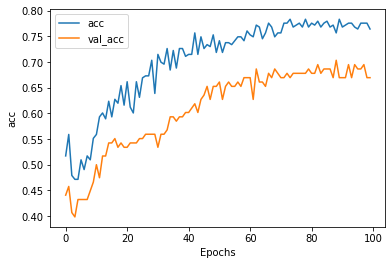

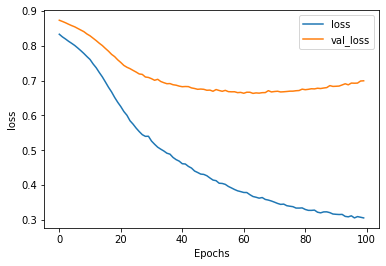

In [135]:
plot_graphs(history, 'acc')
plot_graphs(history, 'loss')

In [ ]:
results_serg_brief = model.predict(np.array(histo_serg_test))
results_nick_brief = model.predict(np.array(histo_nick_test))
results_roma_brief = model.predict(np.array(histo_roma_test))
results_noobject_brief = model.predict(np.array(histo_noobject_test))


In [ ]:
def norm_pred(pred_data):
    s = ''
    for i in range(pred_data.shape[0]):
        for j in range(3):
            if pred_data[i][j] >= 0.5:
                pred_data[i][0], pred_data[i][1], pred_data[i][2] = 0, 0, 0
                pred_data[i][j] = 1
        if max(pred_data[i]) < 0.5:
            pred_data[i][0], pred_data[i][1], pred_data[i][2] = 0, 0, 0
    print(pred_data)
    if (pred_data[0][0] == 1):
        s = 'sirniki'
    if pred_data[0][1] == 1:
        s = 'black book'
    if pred_data[0][2] == 1:
        s = 'color book'
    if pred_data[0][0] == 0 and pred_data[0][1] == 0 and pred_data[0][2] == 0:
        s = 'no object'
    return pred_data, s

In [ ]:
### CREATING BAG-OF-WORDS
def histo_recreate(images, kmeans):
    kmeans.verbose = False
    histo_list = []
    
    #image = cv2.resize(image, (image.shape[0]//4, image.shape[1]//4), interpolation = cv2.INTER_AREA)
    kp, des = orb.detectAndCompute(images, None)
    histo = np.zeros(40)
    nkp = np.size(kp)
    if des is not None:
        for d in des:
            idx = kmeans.predict([d])
            histo[idx] += 1/nkp # Because we need normalized histograms, I prefer to add 1/nkp directly
        
        histo_list.append(histo)
    return histo_list

In [ ]:
cap=cv2.VideoCapture("sirniki.avi",)
counter=0

while(cap.isOpened()):
    ret, frame = cap.read()
    if ret==True:
        frame=cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        counter+=1
        vect=dict()
        temp_dict=dict()
        string=''
        vect=np.array(histo_recreate(frame,kmeans))
        temp=vect.reshape((1,40))
        pred, s = norm_pred(model.predict(temp))
        temp_dict=pred
        string+=f':{s} '
        print(string)
    else:
        break
cap.release()

In [157]:
def mistakes(pred_data, actual_label):
    mist1 = []
    idx = []
    for i in range(pred_data.shape[0]):
        for j in range(3):
            if pred_data[i][j] >= 0.5:
                pred_data[i][0], pred_data[i][1], pred_data[i][2] = 0, 0, 0
                pred_data[i][j] = 1
        if max(pred_data[i]) < 0.5:
            pred_data[i][0], pred_data[i][1], pred_data[i][2] = 0, 0, 0
        if np.sum(abs(np.array(pred_data[i]) - np.array(actual_label))):
            mist1.append(pred_data[i])
            idx.append(i)
    return mist1, idx

In [76]:
def norm_pred(pred_data):
    s = ''
    for i in range(pred_data.shape[0]):
        for j in range(3):
            if pred_data[i][j] >= 0.5:
                pred_data[i][0], pred_data[i][1], pred_data[i][2] = 0, 0, 0
                pred_data[i][j] = 1
        if max(pred_data[i]) < 0.5:
            pred_data[i][0], pred_data[i][1], pred_data[i][2] = 0, 0, 0
    print(pred_data)
    if (pred_data[0][0] == 1):
        s = 'sirniki'
    if pred_data[0][1] == 1:
        s = 'black book'
    if pred_data[0][2] == 1:
        s = 'color book'
    if pred_data[0][0] == 0 and pred_data[0][1] == 0 and pred_data[0][2] == 0:
        s = 'no object'
    return pred_data, s

In [77]:
### CREATING BAG-OF-WORDS
def histo_recreate(images, kmeans):
    kmeans.verbose = False
    histo_list = []
    
    #image = cv2.resize(image, (image.shape[0]//4, image.shape[1]//4), interpolation = cv2.INTER_AREA)
    kp, des = orb.detectAndCompute(images, None)
    histo = np.zeros(40)
    nkp = np.size(kp)
    if des is not None:
        for d in des:
            idx = kmeans.predict([d])
            histo[idx] += 1/nkp # Because we need normalized histograms, I prefer to add 1/nkp directly
        
        histo_list.append(histo)
    return histo_list

In [78]:
cap=cv2.VideoCapture("sirniki.avi",)
counter=0

while(cap.isOpened()):
    ret, frame = cap.read()
    if ret==True:
        frame=cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        counter+=1
        vect=dict()
        temp_dict=dict()
        string=''
        vect=np.array(histo_recreate(frame,kmeans))
        temp=vect.reshape((1,40))
        pred, s = norm_pred(model.predict(temp))
        temp_dict=pred
        string+=f':{s} '
        print(string)
    else:
        break
cap.release()

[[0. 1. 0.]]
:black book 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 1. 0.]]
:black book 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 1. 0.]]
:black book 
[[0. 1. 0.]]
:black book 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[1. 0. 0.]]
:sirniki 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object 
[[0. 0. 0.]]
:no object

In [79]:
def mistakes(pred_data, actual_label):
    mist1 = []
    idx = []
    for i in range(pred_data.shape[0]):
        for j in range(3):
            if pred_data[i][j] >= 0.5:
                pred_data[i][0], pred_data[i][1], pred_data[i][2] = 0, 0, 0
                pred_data[i][j] = 1
        if max(pred_data[i]) < 0.5:
            pred_data[i][0], pred_data[i][1], pred_data[i][2] = 0, 0, 0
        if np.sum(abs(np.array(pred_data[i]) - np.array(actual_label))):
            mist1.append(pred_data[i])
            idx.append(i)
    return mist1, idx

In [ ]:
mist_serg_brief, idx_serg_brief = mistakes(results_serg_brief, [1, 0, 0])

In [161]:
mistakes(results_serg_brief, [1, 0, 0])

([array([0., 0., 1.], dtype=float32),
  array([0., 0., 1.], dtype=float32),
  array([0., 0., 1.], dtype=float32),
  array([0., 0., 1.], dtype=float32),
  array([0., 0., 0.], dtype=float32),
  array([0., 0., 1.], dtype=float32),
  array([0., 0., 1.], dtype=float32),
  array([0., 0., 1.], dtype=float32),
  array([0., 0., 1.], dtype=float32),
  array([0., 1., 0.], dtype=float32),
  array([0., 0., 0.], dtype=float32)],
 [2, 3, 5, 6, 10, 12, 13, 14, 15, 21, 24])

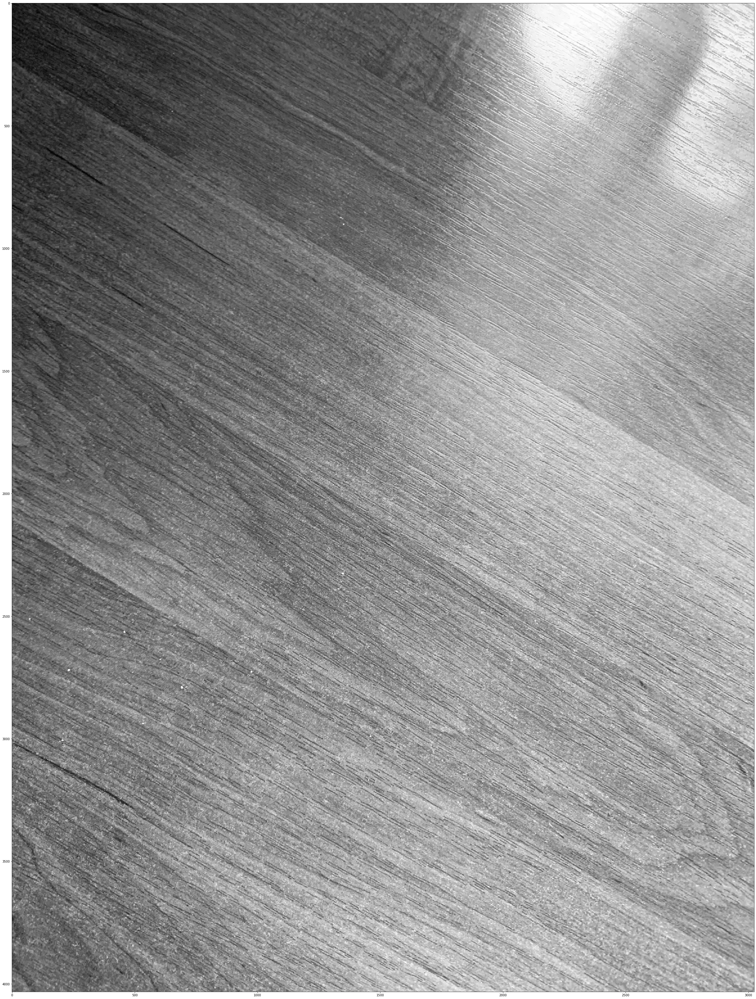

In [177]:
fig1, ax1 = plt.subplots(figsize=(60,60))
ax1.imshow(noobject_images_test[0], cmap='gray', vmin=0, vmax=255)
#arr = np.asarray(nick_images_test[7])
#plt.imshow(arr, cmap='gray', vmin=0, vmax=255, figsize=(60, 60))
#plt.show()

In [162]:
mist_nick_brief, idx_nick_brief = mistakes(results_nick_brief, [0, 1, 0])

In [163]:
mistakes(results_nick_brief, [0, 1, 0])


([array([0., 0., 0.], dtype=float32),
  array([0., 0., 0.], dtype=float32),
  array([0., 0., 1.], dtype=float32),
  array([0., 0., 1.], dtype=float32),
  array([0., 0., 0.], dtype=float32),
  array([0., 0., 1.], dtype=float32),
  array([0., 0., 0.], dtype=float32),
  array([0., 0., 1.], dtype=float32),
  array([0., 0., 1.], dtype=float32),
  array([1., 0., 0.], dtype=float32),
  array([1., 0., 0.], dtype=float32),
  array([1., 0., 0.], dtype=float32),
  array([1., 0., 0.], dtype=float32)],
 [0, 1, 2, 6, 9, 10, 14, 15, 16, 19, 20, 21, 22])

In [164]:
mist_roma_brief, idx_roma_brief = mistakes(results_roma_brief, [0, 0, 1])

In [165]:
mistakes(results_roma_brief, [0, 0, 1])

([array([1., 0., 0.], dtype=float32),
  array([0., 1., 0.], dtype=float32),
  array([0., 1., 0.], dtype=float32),
  array([0., 1., 0.], dtype=float32),
  array([0., 1., 0.], dtype=float32)],
 [3, 13, 19, 20, 27])

In [166]:
mist_noobject_brief, idx_noobject_brief = mistakes(results_noobject_brief, [0, 0, 0])

In [167]:
mistakes(results_noobject_brief, [0, 0, 0])

([array([0., 0., 1.], dtype=float32),
  array([1., 0., 0.], dtype=float32),
  array([1., 0., 0.], dtype=float32),
  array([1., 0., 0.], dtype=float32),
  array([0., 0., 1.], dtype=float32),
  array([1., 0., 0.], dtype=float32),
  array([0., 1., 0.], dtype=float32),
  array([1., 0., 0.], dtype=float32),
  array([0., 0., 1.], dtype=float32),
  array([0., 1., 0.], dtype=float32),
  array([1., 0., 0.], dtype=float32),
  array([1., 0., 0.], dtype=float32),
  array([1., 0., 0.], dtype=float32),
  array([1., 0., 0.], dtype=float32),
  array([0., 1., 0.], dtype=float32),
  array([1., 0., 0.], dtype=float32),
  array([0., 1., 0.], dtype=float32),
  array([1., 0., 0.], dtype=float32),
  array([0., 1., 0.], dtype=float32),
  array([0., 1., 0.], dtype=float32),
  array([0., 1., 0.], dtype=float32),
  array([1., 0., 0.], dtype=float32),
  array([0., 1., 0.], dtype=float32),
  array([1., 0., 0.], dtype=float32),
  array([0., 0., 1.], dtype=float32)],
 [0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,

In [169]:
len(idx_noobject_brief)

25